# Task modelisation
### Import and preprocessing Data
### Modelisation

In [1]:
#import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
import json
from unicodedata import normalize
from sklearn.feature_extraction import stop_words
import random
import spacy
import pandas as pd
from tqdm import tqdm



nlp = spacy.load("en_core_web_sm")
sw = stop_words.ENGLISH_STOP_WORDS


## Data Preparation

In [6]:

# Load near duplicates file
with open("nearDuplicates.json" , encoding = "utf8", mode = "r") as f : 
    nd = json.load(f)

# Index match
with open("nearDuplicatesIndexMatch.json" , encoding = "utf8", mode = "r") as f : 
    nd_index = json.load(f)

print(f"Near Duplicates shape is {len(nd)} and near duplicates index lkength is {len(nd_index)}")


Near Duplicates shape is 144848 and near duplicates index lkength is 98615


In [197]:
# Load duplicates file
with open("Duplicates.json" , encoding = "utf8", mode = "r") as f : 
    d = json.load(f)

# Index match
with open("DuplicatesIndexMatch.json" , encoding = "utf8", mode = "r") as f : 
    d_index = json.load(f)

print(f"Near Duplicates shape is {len(d)} and near duplicates index lkength is {len(d_index)}")

Near Duplicates shape is 578554 and near duplicates index lkength is 578554


In [198]:
# Simulation de non doublons
size = 20000
right = np.random.randint(len(d), size = size)
left = np.random.randint(len(d), size = size)


notd = [(x,y) for x, y in zip(right, left)]

In [199]:
# Flat d_index and nd_index
# nd_index

nd_flat = []
for x, y in nd_index : 
    nd_flat.append((x,y))

# Flat d_index
d_flat = []
for x, y in d_index.items() : 
    for yy in y :
        d_flat.append((x,yy))

print(f"Flatten Duplicates index have length {len(d_flat)} and near Duplicates {len(nd_flat)}")

Flatten Duplicates index have length 746126 and near Duplicates 98615


In [200]:
from utils import getNotice, fields, title_subfields
# TOkenize for fingerprint
def tokenize(sentence) : 
    tokens = [token.lemma_ for token in nlp(sentence.lower()) if token.lemma_ not in sw]
    return [token for token in tokens if token.isalpha()]

# Tokenize for metadata
def metadataTokenizer(sentence) : 
    assert isinstance(sentence, str), "Input must be a list"

    tokens = [token for token in re.sub(r'[^\w\s]',' ',str(sentence).lower()).split()]
    return tokens

# Get batch for training 
def get_data(d, d_flat, size, target) : 
    # This function prepares our data for training. 
    # Input : 
    #   d = duplicates files -- dict
    #   d_index : duplicates index --dict
    #   notd : not duoplicates index
    #   length = length of data
    # Output : 
    #   data : a list of tuple(notice1, notice2, target) 
    
    # Shuffle  list

    data = []
    i = 0
    while i<size :
        try : 
            d_ind1, d_ind2 = random.choice(d_flat)
            data.append((d[int(d_ind1)], d[int(d_ind2)]  , target))
        except : 
            pass
        i +=1
    return data

# Get batch
length = 20000
print("Get data for duplicates...")
data_d = get_data(d,d_flat, size = length, target = 1)

print("Get data for not duplicates...")
data_notd = get_data(d,notd, size = length, target = 0)

print("Get data for duplicates...")
data_nd = get_data(nd,nd_flat, size = length, target = 10)

print("FInished !!!")


data = data_d + data_notd
random.shuffle(data)
print(len(data))

# We prepare data for the Doc2vec model
# What do getNotice do ?
# 1 : select and split all features from each notice in 2 groups : fingerprint and metadata
# 2 : tokenize the 2 newer features with two different tokenizer
# 3 : Add each fingerprint and metadata in two list
# 4 : Shuffle list

print("Building data for doc2vecs...")
text = []
for x in tqdm(data_nd) : 

    n1 = getNotice(x[0], fields = fields, title_subfields = title_subfields)
    n2 = getNotice(x[1], fields = fields, title_subfields = title_subfields)

    for y in [n1, n2] : 
        text.append(y["fingerprint"])
        text.append(y["metadata"])

print(len(text))
print("Finished !!!")
random.shuffle(text)

  0%|          | 0/20000 [00:00<?, ?it/s]Get data for duplicates...
Get data for not duplicates...
Get data for duplicates...
FInished !!!
40000
Building data for doc2vecs...
100%|██████████| 20000/20000 [08:02<00:00, 41.43it/s]80000
Finished !!!



In [201]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(text)]
doc2vec_model = Doc2Vec(documents, vector_size=30, window=10, min_count=2, workers=8)

## First Method to vectorize notice

In [202]:
%%time
from utils import get_training_set
from tqdm import tqdm

# Get learning set
X, y  = get_training_set(data, fields, title_subfields, doc2vec_model)
print(X.shape, y.shape)

4it [00:00, 33.37it/s]get X and Y for train ...
40000it [19:01, 35.04it/s](40000, 60) (40000,)
Wall time: 19min 1s



In [280]:
X.shape

(40000, 60)

## 2nd Method to vectorize notice
The second method compute levenshtein distance between each feature of notices

## Modeling

In [34]:
# Logistic regression : 
logReg = LogisticRegression()
svm = SVC()
nb = GaussianNB()
rf  = RandomForestClassifier()
gbc = GradientBoostingClassifier()

# dictionary of model
models = {"Logistic Regression" : logReg, "SVM" : svm, "Naive Bayes" : nb, "Random Forest" : rf, "GBC" : gbc}

def score(y, y_pred) : 
    assert len(y)==len(y_pred), "Inputs must be the same length"

    # Confusion matrice
    cf_mat = confusion_matrix(y, y_pred)

    # Get TP, TN, FP, FN
    # We have y = {"Negative" =0, "Postive" = 1}

    TN = cf_mat[0,0]
    TP = cf_mat[1,1]
    FN = cf_mat[0,1]
    FP = cf_mat[1,0]

    # Accuracy
    accuracy = (TP + TN) / (TP + TN + FN + FP)

    # Precision
    precision = TP / (TP + FP)

    # Recall
    recall = TP / (TP + FN)

    # F1 Score
    f1 = 2*(accuracy*recall) / (accuracy + recall)

    return {"accuracy": accuracy, "precision":precision, "recall" : recall, "F1_score": f1, "Confusion Matrix" : cf_mat}


In [279]:
# Split and train test set and modelisation
#from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import recall_score, f1_score

X_train, X_test, y_train,  y_test = train_test_split(X, y, test_size=0.50, shuffle= True, stratify = y)
print(f"X_train shape is {X_train.shape}")
print(f"X_test shape is {X_test.shape}")
print(f"y_train shape is {y_train.shape}")
print(f"y_test shape is {y_test.shape}")


print("Model...")
keys = models.keys()
for name, model in models.items() : 
    model.fit(X_train, y_train)
    ypred = model.predict(X_test)
    #precision, recall, fscore, support = score(y_test, ypred)
    recall = recall_score(y_test, ypred)
    prec = accuracy_score(y_test, ypred)
    f1 = f1_score(y_test, ypred)
    print(f"Model {name} \t precision : {prec} \t recall : {recall} \t f1 score : {f1}")

X_train shape is (20000, 60)
X_test shape is (20000, 60)
y_train shape is (20000,)
y_test shape is (20000,)
Model...
Model Logistic Regression 	 precision : 0.86375 	 recall : 0.8799 	 f1 score : 0.8659154652364316
Model SVM 	 precision : 0.8801 	 recall : 0.8735 	 f1 score : 0.879303402456211
Model Naive Bayes 	 precision : 0.8461 	 recall : 0.8906 	 f1 score : 0.8526567735758736
Model Random Forest 	 precision : 0.8756 	 recall : 0.8181 	 f1 score : 0.8680106100795756
Model GBC 	 precision : 0.87575 	 recall : 0.861 	 f1 score : 0.8738898756660746


In [242]:
# Looking for best parameters for random forest

# Parametrage de la fonction gradient Boosting
from sklearn.model_selection import GridSearchCV

# Set hyperparameter interval
params = {"learning_rate" : [0.3, 0.2, 0.1, 0.05, 0.01], "max_depth" : [2,3,4,5,6], "subsample" : [1, 0.8, 0.6, 0.5]}
params = {"kernel" : ['linear', 'rbf', 'poly'], "gamma" : [1e-4, 1e-3,1e-2, 0.1], 'C': [1, 10, 100, 1000]}
params = {"penalty" : ["l1", "l2", "elasticnet", "none"], "C" : [0.001,0.01,0.1,1.0,10.0,100.0] }

# Instanciate gridSearch
grille = GridSearchCV(estimator = LogisticRegression(), param_grid = params, scoring = "accuracy")

# Fitting
print("Looking for best parameters...")
lr = grille.fit(X_train, y_train) 

# best params
print(lr.best_params_)

#Get optim paramters
ypredOptim = lr.predict(X_test)

# Accuracy of best model
print(f1_score(y_test, ypredOptim), accuracy_score(y_test, ypredOptim), recall_score(y_test, ypredOptim))

Looking for best parameters...
{'C': 0.001, 'penalty': 'none'}
0.8690813335320714 0.86825 0.8746


In [251]:

plot_decision_regions(X_test, y_test, lr)

ValueError: X has 2 features per sample; expecting 60

In [43]:

# Parametrage de la fonction gradient Boosting
from sklearn.model_selection import GridSearchCV

# Set hyperparameter interval
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


# Instanciate gridSearch
grille = GridSearchCV(estimator = rf, param_grid = random_grid, scoring = "accuracy")

# Fitting
print("Looking for best parameters...")
optim_rf = grille.fit(X_train, y_train) 

# best params
print(optim_rf.best_params_)

#Get optim paramters
ypredOptim = optim_rf.predict(X_test)

# Accuracy of best model
print(score(y_test, ypredOptim))

Looking for best parameters...


KeyboardInterrupt: 

In [208]:
#svc = SVC(probability=True, C = 100, kernel= "rbf", gamma=1e-2)

#svc.fit(X_train, y_train)
y_pred = logReg.predict(X_test)

# Predict probability
y_pred_proba = rf.predict_proba(X_test)

# Accuracy of best model
print(score(y_test, y_pred))

(array([0.83312522, 0.92501138]), array([0.9341, 0.8129]), array([0.88072789, 0.86533958]), array([10000, 10000], dtype=int64))


In [209]:
ind = 100
for x,z, yy in zip(y_pred[:ind],y_test[:ind], y_pred_proba[:ind]) :
    print(x,z, yy)


0.0 0.0 [0.96 0.04]
1.0 1.0 [0.05 0.95]
1.0 1.0 [0.4 0.6]
0.0 0.0 [0.92 0.08]
1.0 1.0 [0. 1.]
0.0 0.0 [0.69 0.31]
0.0 0.0 [0.85 0.15]
0.0 1.0 [0.65 0.35]
0.0 0.0 [0.68 0.32]
0.0 1.0 [0.51 0.49]
0.0 1.0 [0.66 0.34]
0.0 0.0 [0.81 0.19]
1.0 1.0 [0. 1.]
1.0 1.0 [0. 1.]
1.0 1.0 [0.34 0.66]
1.0 1.0 [0.01 0.99]
0.0 0.0 [0.7 0.3]
1.0 1.0 [0. 1.]
1.0 1.0 [0.35 0.65]
1.0 1.0 [0.17 0.83]
0.0 0.0 [0.84 0.16]
0.0 0.0 [0.53 0.47]
0.0 1.0 [0.71 0.29]
0.0 0.0 [0.92 0.08]
0.0 0.0 [0.63 0.37]
1.0 1.0 [0. 1.]
1.0 1.0 [0.25 0.75]
1.0 1.0 [0.03 0.97]
1.0 1.0 [0. 1.]
1.0 0.0 [0.48 0.52]
0.0 0.0 [0.72 0.28]
1.0 1.0 [0.28 0.72]
0.0 0.0 [0.55 0.45]
0.0 0.0 [0.74 0.26]
0.0 0.0 [0.85 0.15]
0.0 0.0 [0.81 0.19]
0.0 0.0 [0.59 0.41]
0.0 0.0 [0.79 0.21]
0.0 0.0 [0.93 0.07]
1.0 1.0 [0.33 0.67]
0.0 0.0 [0.6 0.4]
1.0 1.0 [0.02 0.98]
1.0 1.0 [0.49 0.51]
1.0 1.0 [0.22 0.78]
1.0 1.0 [0. 1.]
0.0 1.0 [0.59 0.41]
1.0 1.0 [0.03 0.97]
0.0 0.0 [0.74 0.26]
1.0 0.0 [0.45 0.55]
1.0 1.0 [0.42 0.58]
1.0 1.0 [0. 1.]
1.0 1.0 [0.4 0.6]


In [ ]:
ttt = []
for x, y in nd_flat : 
    t = np.array(compareNotice(nd[x], nd[y], fields, doc2vec_model=doc2vec_model)).reshape(1,-1)
    ttt.append((x, y, np.where(rf.predict_proba(t)[0][1]>0.75, 1, 0).tolist()))

In [250]:
from matplotlib.colors import ListedColormap

def plot_decision_regions(X,y,classifier,test_idx=None,resolution=0.02):

    Z = classifier.predict(np.array([xx1.ravel(),xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    
    X = PCA(n_components=2).fit_transform(X)
    # Initialise the marker types and colors
    markers = ('s','x','o','^','v')
    colors = ('red','blue','lightgreen','gray','cyan')
    color_Map = ListedColormap(colors[:len(np.unique(y))]) #we take the color mapping correspoding to the 
                                                            #amount of classes in the target data
    
    # Parameters for the graph and decision surface
    x1_min = X[:,0].min() - 1
    x1_max = X[:,0].max() + 1
    x2_min = X[:,1].min() - 1
    x2_max = X[:,1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min,x1_max,resolution),
                           np.arange(x2_min,x2_max,resolution))
    
    #Z = classifier.predict(np.array([xx1.ravel(),xx2.ravel()]).T)
    #Z = Z.reshape(xx1.shape)
    
    plt.contour(xx1,xx2,Z,alpha=0.4,cmap = color_Map)
    plt.xlim(xx1.min(),xx1.max())
    plt.ylim(xx2.min(),xx2.max())

    #X = PCA(n_components=2).fit_transform(X)
    
    # Plot samples
    X_test, Y_test = X[test_idx,:], y[test_idx]
    
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x = X[y == cl, 0], y = X[y == cl, 1],
                    alpha = 0.8, c = color_Map(idx),
                    marker = markers[idx], label = cl
                   )

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

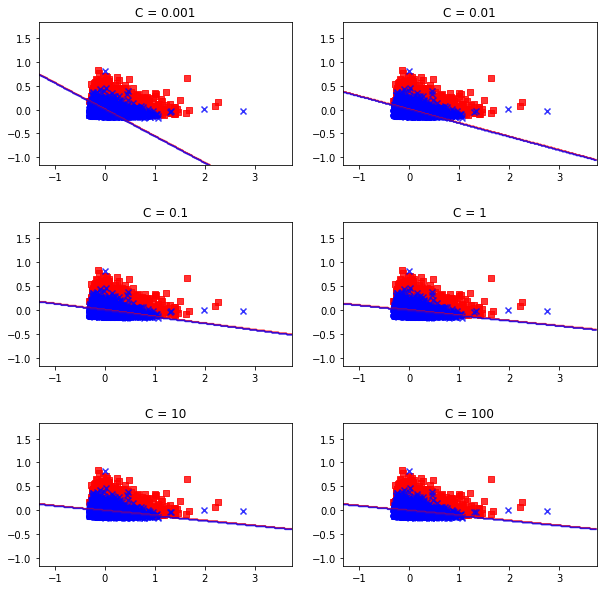

In [226]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_train_red = pca.fit_transform(X_train)
X_test_red = pca.fit_transform(X_test)


C_param_range = [0.001,0.01,0.1,1,10,100]


plt.figure(figsize=(10, 10))

j = 0
for i in C_param_range:
    
    # Apply logistic regression model to training data
    lr = LogisticRegression(penalty = 'l2', C = i,random_state = 0)
    lr.fit(X_train_red,y_train)
    
    # Predict using model
    y_pred = lr.predict(X_test_red)
    
    # Saving accuracy score in table
    #acc_table.iloc[j,1] = accuracy_score(y_test,y_pred)
    j += 1
    
    # Printing decision regions
    plt.subplot(3,2,j)
    plt.subplots_adjust(hspace = 0.4)
    plot_decision_regions(X = X_test_red
                      , y = y_test
                      , classifier = lr
                      , test_idx = range(105,150))
    #plt.xlabel('Petal length')
    #plt.ylabel('Petal width')
    plt.title('C = %s'%i)

In [39]:
#Get optim paramters
#ypredOptim = optim_gbc.predict(X_test, )
svc = SVC(gamma= 0.1, kernel= 'rbf', C= 100, probability = True)

svc.fit(X_train, y_train)

rfo = RandomForestClassifier(n_estimators=10)

SVC(C=100, gamma=0.1, probability=True)

In [477]:
import pickle
filename = 'svc_model.sav'
pickle.dump(rf, open(filename, 'wb'))
 
# some time later...
 


## Tester sur les données de near Duplicates


In [ ]:
# Application sur les données near Duplicates

# Vectorizsation des notices 
vecs = df.apply(lambda row: getVec2Notice(row, doc2vec_model = doc2vec_model), axis=1)
arr = np.stack(vecs).astype("float32")

In [267]:
# Inférence sur les données near Duplicates avec le modèle obtenu
# Les couple de nearDuplicates sont situé dans nd_flat. Nous l'utiliserons donc pour aligner pour trouver des couples de vecteurs
def computeVector(tupl, arr) : 
    assert isinstance(tupl, tuple), 'tupl must be a tuple'
    assert hasattr(arr, '__array__'), "arr must be an array"

    vec1 = arr[tupl[0], :]
    vec2 = arr[tupl[1], :]
    return np.abs(vec1 - vec2)

# Diff is a annray represent difference between near Duplicates vectors
diff = pd.Series(nd_flat).apply(lambda x: computeVector(x, arr))
diff = np.stack(diff)
diff.shape

(98615, 60)

In [326]:
from collections import Counter
# predict with model what tuple is dulicates or not (usnig best model)

# Model
# For the model, we take a probability of 0.75 like threshold

def labelling(x, classifier = lr, threshold = 0.75) : 

    x = x.reshape(1,-1)
    assert len(x)==1, 'Yes'

    prob = classifier.predict_proba(x)

    arg = np.argmax(prob)
    
    if prob[:,arg] > 0.75 : 
        return arg
    else : 
        return -1

#classif = labelling(diff[0,:], classifier = lr)

classif = np.apply_along_axis(labelling, axis = 1, arr = diff)
count = Counter(classif)
count

98615


In [332]:
# Clustering differnece what value are duplicates or not (using faiss)

ncentroids = 3
niter = 20
verbose = True
d = diff.shape[1]
kmeans = faiss.Kmeans(d, ncentroids, niter=niter, verbose=verbose)
kmeans.train(diff)
D, I = kmeans.index.search(diff, 1)
count_f = Counter(I.ravel())
count_f

In [341]:
c1, c2, c3 = kmeans.centroids

In [344]:
k1, k0, k = [], [], []
for x, yy in zip(diff, classif) : 
    if yy == 1 : 
        k1.append(x)
    elif yy == 0 : 
        k0.append(x)
    else : 
        k.append(x) 


In [354]:
cc1 = np.mean(np.stack(k1), axis = 0)
cc0 = np.mean(np.stack(k0), axis = 0)
cc = np.mean(np.stack(k), axis = 0)

In [362]:
dist = {}
for i, k in {"cc1": cc1, "cc0" : cc0, "cc" : cc}.items() : 
    dist[i] = []
    for j in [c1,c2,c3] : 
        dist[i].append(np.dot(k, j))

In [363]:
dist

{'[0.01142107 0.01635825 0.01224153 0.01501346 0.02627084 0.01076957\n 0.02088782 0.01579265 0.01150411 0.01076518 0.0171156  0.01119449\n 0.01139561 0.01516003 0.01861523 0.01577097 0.01472172 0.01036693\n 0.0151357  0.01580804 0.01528439 0.0165237  0.01127848 0.01542978\n 0.01634645 0.01154632 0.02014167 0.01689101 0.0130656  0.01329766\n 0.0374822  0.03360279 0.03086486 0.04345397 0.06551336 0.04040499\n 0.03803474 0.04286592 0.03934632 0.04034075 0.04144339 0.0348852\n 0.04376137 0.03569478 0.05958992 0.03374713 0.03675318 0.03499556\n 0.05793321 0.05072106 0.06384727 0.05167786 0.04041671 0.06048997\n 0.04542846 0.03155517 0.08276092 0.03540841 0.0394088  0.04000608]': [0.065038264,
  0.14047775,
  0.069607124],
 '[0.02552313 0.04059161 0.02743468 0.03067966 0.07734305 0.0250767\n 0.06226495 0.04799219 0.02395116 0.01901309 0.05295994 0.02913154\n 0.02341022 0.05116387 0.05955907 0.04630535 0.04091108 0.02044437\n 0.04343143 0.03809911 0.04522239 0.03634491 0.0263085  0.04930527\n

In [501]:
# Expression des vecteurs puis calcul de similarité
ndd= []
for notice in tqdm(nd) :    
    ndd.append(getVec2Notice(notice, fields = fields, model_f=model_f, model_m = model_f))


100%|██████████| 144848/144848 [47:51<00:00, 50.45it/s]


In [ ]:
nddf = pd.DataFrame(nd)


def getNearDuplicatesIndex(notice, df = nddf)
    index = {}
    for i, near in enumerate(nddf.nearDuplicates) : 
        index[i] = nd.index[nd.idConditor == notice['nearDuplicates'].loc[0][0]['idConditor']][0]

In [121]:
#right = set([x[0] for x in nd_flat])
#arr = vecs.astype("float32")



In [252]:
df.shape

(144848, 68)

In [138]:
    #xb = np.array(ndd).astype("float32")
import faiss

d = arr.shape[1]
k = 10

# Get similar documents
index = faiss.IndexFlatL2(d)

# Add vector to the index
index.add(arr)  

D, I = index.search(arr, k)

In [141]:
check = []
for line in I[:,:] : 
    for i in range(1,10) : 
        check.append((line[0], line[i]))
print(len(check))

1303632


In [150]:
check1 = [(x[0], x[1]) for x in I[:,:]]
inp = list(set(check)&set(nd_flat))
len(inp)

2156

In [159]:
t = np.array(compareNotice(nd[x], nd[y], fields, doc2vec_model=doc2vec_model)).reshape(1,-1)
rf.predict_proba(t)[0]

array([0.65, 0.35])

In [183]:
ttt = []
for x, y in nd_flat : 
    t = np.array(compareNotice(nd[x], nd[y], fields, doc2vec_model=doc2vec_model)).reshape(1,-1)
    ttt.append((x, y, np.where(rf.predict_proba(t)[0][1]>0.75, 1, 0).tolist()))